# DATATHON2024 

## TAKIM ADI: **DataPioneers**

## YARIŞMACILAR:
- **ÖMER YENTÜR**: https://www.linkedin.com/in/yentur/
- **FATMA BETÜL ARSLAN**: https://www.linkedin.com/in/fatma-bet%C3%BCl-arslan/
- **MERVE DİNÇER**: https://www.linkedin.com/in/merve-din%C3%A7er-58901b23b/

**Gerekli Kütüphanelerin indirilmesi :**

In [5]:
#!pip install optuna catboost scikit-learn numpy pandas unidecode seaborn plotly shap

**Kullanılan kütüphanelerin içeri aktarılması:**

In [6]:
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import LabelEncoder
from catboost import CatBoostRegressor
from sklearn.metrics import r2_score
from unidecode import unidecode
from collections import Counter
import matplotlib.pyplot as plt
import seaborn as sns
from catboost import Pool
import plotly.graph_objects as go
import plotly.express as px
import textwrap
import pandas as pd
import numpy as np
import optuna
import re
import shap

import warnings
warnings.filterwarnings("ignore")


[notice] A new release of pip is available: 24.0 -> 24.2
[notice] To update, run: C:\Users\omeryentur\AppData\Local\Programs\Python\Python38\python.exe -m pip install --upgrade pip


**Verilerin Okunması:**

In [7]:
train=pd.read_csv("./train.csv").iloc[:-1]
test=pd.read_csv("./test_x.csv")

**Yıllara Göre Değerlendirme Puanının Dağılımı**

Not: Bu grafikte 2016’nın dağılımı düşük olduğu için ileride eğitim verisinden çıkaracağız.

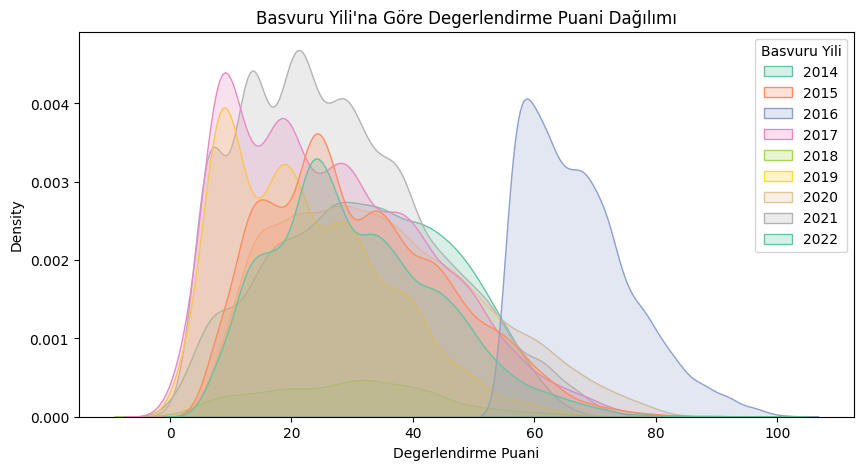

In [8]:
plt.figure(figsize=(10, 5))

sns.kdeplot(data=train, x="Degerlendirme Puani", hue="Basvuru Yili", fill=True, 
            palette="Set2")  
plt.title("Basvuru Yili'na Göre Degerlendirme Puani Dağılımı")
plt.xlabel("Degerlendirme Puani")
plt.ylabel("Density")

# Grafiği gösterme
plt.show()

**Sütunların Benzersiz Sayılarının Grafiği**

In [9]:
unique_counts = train.drop("id",axis=1).nunique()
fig = go.Figure()

fig.add_trace(go.Bar(
    x=unique_counts.index, 
    y=unique_counts.values,  
    marker_color='royalblue'
))


fig.update_layout(
    title='Number of Unique Values per Column',
    xaxis_title='Columns',
    yaxis_title='Unique Value Count',
    xaxis_tickangle=-45,  
    height=600,  
    width=1000,  
    template='plotly_white'  
)

fig.show()

**Eğitim Verisindeki Eksikliklerin Oranı**

In [10]:
missing_proportions = train.isnull().mean()

high_missing_cols = missing_proportions[missing_proportions > 0.50]

sorted_missing_proportions = missing_proportions.sort_values(ascending=False)

wrapped_names = [textwrap.fill(name, width=20) for name in sorted_missing_proportions.index]

fig = go.Figure()


fig.add_trace(go.Bar(
    x=wrapped_names,
    y=sorted_missing_proportions.values,
    marker_color='royalblue'
))


highlighted_names = [textwrap.fill(name, width=20) for name in high_missing_cols.index]
fig.add_trace(go.Bar(
    x=highlighted_names,
    y=high_missing_cols.values,
    marker_color='crimson',
    name='Yüksek Eksik Oranı (>%50)'
))

fig.update_layout(
    title='Train özelliğe Göre Eksik Değerlerin Oranı',
    xaxis_title='Features',
    yaxis_title='Eksik Değerlerin Oranı',
    xaxis_tickangle=-45,  
    height=800,  
    width=1200,   
    template='plotly_white'
)

fig.show()


**Test Verisindeki Eksikliklerin Oranı**

In [11]:
missing_proportions = test.isnull().mean()

high_missing_cols = missing_proportions[missing_proportions > 0.50]

sorted_missing_proportions = missing_proportions.sort_values(ascending=False)

wrapped_names = [textwrap.fill(name, width=20) for name in sorted_missing_proportions.index]

fig = go.Figure()


fig.add_trace(go.Bar(
    x=wrapped_names,
    y=sorted_missing_proportions.values,
    marker_color='royalblue'
))


highlighted_names = [textwrap.fill(name, width=20) for name in high_missing_cols.index]
fig.add_trace(go.Bar(
    x=highlighted_names,
    y=high_missing_cols.values,
    marker_color='crimson',
    name='Yüksek Eksik Oranı (>%50)'
))

fig.update_layout(
    title='Train özelliğe Göre Eksik Değerlerin Oranı',
    xaxis_title='Features',
    yaxis_title='Eksik Değerlerin Oranı',
    xaxis_tickangle=-45,  
    height=800,  
    width=1200,   
    template='plotly_white'
)

fig.show()


**Sütunların Değerlendirme Puanı Üzerindeki Etkileri**

In [12]:
import plotly.express as px

fig = px.box(
    train,
    x="Lise Mezuniyet Notu",
    y="Degerlendirme Puani",
    title="Box Plot of Degerlendirme Puani by Lise Mezuniyet Notu"
)


fig.update_traces(marker=dict(color='rgba(219, 64, 82, 0.6)'),  
                  boxmean='sd')  


fig.update_layout(
    xaxis_title="Lise Mezuniyet Notu",
    yaxis_title="Degerlendirme Puani",
    xaxis_tickangle=-45,  
    title_font_size=18,  
    xaxis_title_font_size=14,  
    yaxis_title_font_size=14,  
    height=600,  
    width=1000,  
    template='plotly_white'  
)


fig.show()


In [13]:
fig = px.box(
    train,
    x="Universite Not Ortalamasi",
    y="Degerlendirme Puani",
    title="Box Plot of Degerlendirme Puani by Universite Not Ortalamasi"
)

fig.update_traces(marker=dict(color='rgba(219, 64, 82, 0.6)'),  
                  boxmean='sd')  

fig.update_layout(
    xaxis_title="Universite Not Ortalamasi",
    yaxis_title="Degerlendirme Puani",
    xaxis_tickangle=-45,  
    title_font_size=18, 
    xaxis_title_font_size=14,  
    yaxis_title_font_size=14, 
    height=600,  
    width=1000,  
    template='plotly_white'  
)

fig.show()

In [14]:
fig = px.box(
    train,
    x="Lise Turu",
    y="Degerlendirme Puani",
    title="Box Plot of Degerlendirme Puani by Lise Turu"
)

fig.update_traces(marker=dict(color='rgba(219, 64, 82, 0.6)'),  
                  boxmean='sd')  

fig.update_layout(
    xaxis_title="Lise Turu",
    yaxis_title="Degerlendirme Puani",
    xaxis_tickangle=-45,  
    title_font_size=18, 
    xaxis_title_font_size=14,  
    yaxis_title_font_size=14, 
    height=600,  
    width=1000,  
    template='plotly_white'  
)

fig.show()

In [15]:
fig = px.box(
    train,
    x="Burslu ise Burs Yuzdesi",
    y="Degerlendirme Puani",
    title="Box Plot of Degerlendirme Puani by Burslu ise Burs Yüzdesi"
)

fig.update_traces(marker=dict(color='rgba(219, 64, 82, 0.6)'),  
                  boxmean='sd')  

fig.update_layout(
    xaxis_title="Burslu ise Burs Yüzdesi",
    yaxis_title="Degerlendirme Puani",
    xaxis_tickangle=-45,  
    title_font_size=18, 
    xaxis_title_font_size=14,  
    yaxis_title_font_size=14, 
    height=600,  
    width=1000,  
    template='plotly_white'  
)

fig.show()

In [16]:
fig = px.box(
    train,
    x="Universite Kacinci Sinif",
    y="Degerlendirme Puani",
    title="Box Plot of Degerlendirme Puani by Universite Kacinci Sinif"
)

fig.update_traces(marker=dict(color='rgba(219, 64, 82, 0.6)'),  
                  boxmean='sd')  

fig.update_layout(
    xaxis_title="Universite Kacinci Sinif",
    yaxis_title="Degerlendirme Puani",
    xaxis_tickangle=-45,  
    title_font_size=18, 
    xaxis_title_font_size=14,  
    yaxis_title_font_size=14, 
    height=600,  
    width=1000,  
    template='plotly_white'  
)

fig.show()

In [17]:
fig = px.box(
    train,
    x="Basvuru Yili",
    y="Degerlendirme Puani",
    title="Box Plot of Degerlendirme Puani by Basvuru Yili"
)

fig.update_traces(marker=dict(color='rgba(219, 64, 82, 0.6)'),  
                  boxmean='sd')  

fig.update_layout(
    xaxis_title="Basvuru Yili",
    yaxis_title="Degerlendirme Puani",
    xaxis_tickangle=-45,  
    title_font_size=18, 
    xaxis_title_font_size=14,  
    yaxis_title_font_size=14, 
    height=600,  
    width=1000,  
    template='plotly_white'  
)

fig.show()

**Büyük Dil Modelleri Kullanarak Maplediğimiz Sütunların JSON Şeklinde Alınması**

In [18]:
import json

def load_from_json_file(file_path):
    try:
        with open(file_path, 'r', encoding='utf-8') as file:
            data = json.load(file)
        return data
    except FileNotFoundError:
        print(f"Hata: {file_path} dosyası bulunamadı.")
    except json.JSONDecodeError:
        print("Hata: JSON verisi çözülemiyor.")
    except Exception as e:
        print(f"Bir hata oluştu: {e}")

In [19]:
train=train[train['Basvuru Yili']!=2016]

**Sütunlara Mapleme İşleminin Gerçekleştirilmesi**

In [20]:
df=pd.concat([train,test],axis=0).reset_index(drop=True)

object_columns = df.select_dtypes('object').columns
df[object_columns]=df[object_columns].astype(str)
df[object_columns] = df[object_columns].applymap(str.lower)


girişimci_mapping = {'evet':1, 'hayır':0}
cinsiyet_mapping = {'erkek': 1,  'kadın': 2, 'belirtmek istemiyorum': 0,'nan':0}
uni_mapping = {'devlet': 1,  'özel': 0,'nan':0}
uni_sinif_mapping = {'1': 1, '2': 2, '3': 3,'4': 4, '5': 5,'6':6,'yüksek lisans':7,'tez':7,'mezun':8,"hazırlık":0,"0":0,'nan':0}
uni_not_mapping = {'not ortalaması yok': 0, 'ortalama bulunmuyor': 0,'hazırlığım': 0,
                   '0 - 1.79':1 ,'1.00 - 2.50':2,'1.80 - 2.49':3,'2.50 ve altı':2,'2.00 - 2.50':2,"3.00-2.50":3,
                   "2.50 - 3.00":3,"2.50 - 2.99":3,'2.50 -3.00':3,'3.00 - 3.50':4,'3.50-3':4,'3.00 - 3.49':4,'3.00 - 4.00':4,'3.50 - 4.00':5,'4-3.5':5,'4.0-3.5':5,'nan':0}
mezun_mapping = {'evet': 1, 'hayır': 0,'nan':0}
lise_turu_mapping = {'i̇mam hatip lisesi': 1, 'diğer': 0, 'devlet': 1,'düz lise': 2,
                   'meslek lisesi':2 ,'meslek':2,'özel':3,"özel lisesi":3,
                   "özel lise":3, 'anadolu lisesi':4,'fen lisesi':5,'nan':0}



lise_not_mapping = {
    '75 - 100': 5,
    '84-70': 4,
    '100-85': 5,
    '4.00-3.50': 5,
    '50 - 75': 3,
    '3.00 - 4.00': 4,
    '3.50-3.00': 4,
    '3.50-3': 4,
    '69-55': 3,
    '3.00-2.50': 3,
    '50 - 74': 3,
    '2.50 ve altı': 2,
    '54-45': 2,
    '25 - 50': 1,
    'not ortalaması yok': 0,
    '44-0': 0,
    '0 - 25': 0,
    '25 - 49': 1,
    'nan':0}

burslu_mapping = {'evet': 1, 'hayır': 0,'nan':0}

anne_egitim_mapping = {
    'i̇lkokul': 1,
    'i̇lkokul mezunu': 1,
    'eğitim yok': 0,
    'eği̇ti̇m yok': 0,
    'eğitimi yok':0,
    'ortaokul': 2,
    'ortaokul mezunu': 2,
    'lise': 3,
    'li̇se':3,
    'lise mezunu': 3,
    'üniversite': 4,
    'üni̇versi̇te':4,
    'üniversite mezunu': 4,
    'yüksek li̇sans': 5,
    'yüksek lisans':5,
    'yüksek lisans / doktora': 5,
    'yüksek lisans / doktara':5,
    'doktora': 6,
    'nan':0
}
anne_calisma_mapping = {'evet': 1, 'hayır': 3,'emekli':2, 'nan':0}

anne_sector_mapping = {'0': 0, '-': 0,'özel sektör':3,'diğer':1,'di̇ğer':1,'kamu':2,'nan':0}


baba_egitim_mapping = {
    'üniversite': 4,
    'yüksek lisans / doktora': 5,
    'i̇lkokul mezunu':1,
    'nan':0,
    'ortaokul mezunu':2,
    'lise': 3,
    'eğitim yok':0,
        "0":0,
    'üniversite mezunu':4,
    'lise mezunu':3,
     'yüksek lisans / doktara':5,
    'üni̇versi̇te':4,
    'eği̇ti̇m yok':0,
    'li̇se':3,
    'yüksek li̇sans':5,
    'doktora':6,
    'i̇lkokul':1,
    'ortaokul':2,
    'yüksek lisans':5,
    'eğitimi yok':0,


}

baba_calisma_mapping = {'evet': 1, 'hayır': 3,'emekli':2, 'nan':0}

baba_sector_mapping = {'0': 0, '-': 0,'özel sektör':1,'diğer':1,'di̇ğer':1,'kamu':2, 'nan':0}



kardes_sayisi_mapping = {
    'kardeş sayısı 1 ek bilgi aile hk. anne vefat': 1,
    "0.0": 0,"1.0": 1,"2.0": 2,"3.0": 3,"4.0": 4,"5.0": 5,"6.0": 6,"7.0": 7,"8.0": 8,"9.0": 9,"10.0": 10,"11.0": 11,"12.0": 12,"13.0": 13,"14.0": 14,"18": 18,
    "0": 0,"1": 1,"2": 2,"3": 3,"4": 4,"5": 5,"6": 6,"7": 7,"8": 8,"9": 9,"10": 10,"11":11,"13":13,"12":12,"14":14,'nan':0}

giris_kulub_mapping = {'hayır': 0, 'evet': 1, 'nan':0}
spor_mapping = {'nan':0 ,'hayır': 1, 'evet': 2}
spor_rol_mapping = {'0': 0, '-': 0,'diğer':1,'bireysel':2,'bireysel spor':2,'takım oyuncusu':3,'lider/kaptan':4,'kaptan/lider':4,"di̇ğer":1,'kaptan / li̇der':4,'kaptan':4, 'nan':0}
stk_mapping = {'nan':0, 'hayır': 1, 'evet': 2}
stk2_mapping = {'nan':0 ,'hayır': 1, 'evet': 2}
girisim_mapping = {'hayır': 0, 'evet': 1, 'nan':0}
ing_mapping = {'hayır': 0, 'evet': 1, 'nan':0}
ing_seviye_mapping = {'0': 0, 'başlangıç': 1,'orta':2,'i̇leri':3, 'nan':0}
baska_bir_kurumdan_burs_aliyor_mu ={'hayır':0, 'evet':1, 'nan':0}

burs_mapping = load_from_json_file('burs_mapping.json')
sehir_mapping = load_from_json_file('sehir_mapping.json')
bolum_mapping = load_from_json_file('bolum_mapping.json')
lise_bolum_mapping = load_from_json_file('lise_bolum_mapping.json')
universite_adi_mapping = load_from_json_file('universite_adi_mapping.json')
dogum_yeri_mapping = load_from_json_file('dogum_yeri_mapping.json')
bolum_mapping2 = load_from_json_file('bölüm_mapping2.json')

In [21]:
df['Cinsiyet'] = df['Cinsiyet'].map(cinsiyet_mapping)
df['Universite Turu'] = df['Universite Turu'].map(uni_mapping)
df['Universite Kacinci Sinif'] = df['Universite Kacinci Sinif'].map(uni_sinif_mapping)
df['Universite Not Ortalaması'] = df['Universite Not Ortalamasi'].map(uni_not_mapping)
df['Daha Once Baska Bir Universiteden Mezun Olmus'] = df['Daha Once Baska Bir Universiteden Mezun Olmus'].map(mezun_mapping)
df['Lise Turu'] = df['Lise Turu'].map(lise_turu_mapping)
df['Lise Mezuniyet Notu'] = df['Lise Mezuniyet Notu'].map(lise_not_mapping)
df['Burs Aliyor mu?'] = df['Burs Aliyor mu?'].map(burslu_mapping)
df['Anne Egitim Durumu'] = df['Anne Egitim Durumu'].map(anne_egitim_mapping)
df['Anne Calisma Durumu'] = df['Anne Calisma Durumu'].map(anne_calisma_mapping)
df['Anne Sektor'] = df['Anne Sektor'].map(anne_sector_mapping)
df['Baba Egitim Durumu'] = df['Baba Egitim Durumu'].map(baba_egitim_mapping)
df['Baba Calisma Durumu'] = df['Baba Calisma Durumu'].map(baba_calisma_mapping)
df['Baba Sektor'] = df['Baba Sektor'].map(baba_sector_mapping)
df['Kardes Sayisi'] = df['Kardes Sayisi'].astype(str).map(kardes_sayisi_mapping)
df['Girisimcilik Kulupleri Tarzi Bir Kulube Uye misiniz'] = df['Girisimcilik Kulupleri Tarzi Bir Kulube Uye misiniz?'].map(giris_kulub_mapping)
df['Profesyonel Bir Spor Daliyla Mesgul musunuz?'] = df['Profesyonel Bir Spor Daliyla Mesgul musunuz?'].map(spor_mapping)
df['Spor Dalindaki Rolunuz Nedir?'] = df['Spor Dalindaki Rolunuz Nedir?'].map(spor_rol_mapping)
df['Aktif olarak bir STK üyesi misiniz?'] = df['Aktif olarak bir STK üyesi misiniz?'].map(stk_mapping)
df['Stk Projesine Katildiniz Mi'] = df['Stk Projesine Katildiniz Mi?'].map(stk2_mapping)
df['Girisimcilikle Ilgili Deneyiminiz Var Mi'] = df['Girisimcilikle Ilgili Deneyiminiz Var Mi?'].map(girisim_mapping)
df['Ingilizce Biliyor musunuz?'] = df['Ingilizce Biliyor musunuz?'].map(ing_mapping)
df['Ingilizce Seviyeniz?'] = df['Ingilizce Seviyeniz?'].map(ing_seviye_mapping)
df['Baska Bir Kurumdan Burs Aliyor mu?']=df['Baska Bir Kurumdan Burs Aliyor mu?'].map(baska_bir_kurumdan_burs_aliyor_mu)
df['Burslu ise Burs Yuzdesi']=df['Burslu ise Burs Yuzdesi'].fillna(0)
df["Baska Kurumdan Aldigi Burs Miktari"] = df["Baska Kurumdan Aldigi Burs Miktari"].map(burs_mapping)
df["Baska Kurumdan Aldigi Burs Miktari"]=df["Baska Kurumdan Aldigi Burs Miktari"].fillna(0)
df['Universite Adı']=df['Universite Adi'].fillna("bilinmiyor")

In [22]:
columns=['Dogum Tarihi', 'Dogum Yeri', 'Ikametgah Sehri', 'Universite Adı',
       'Bölüm', 'Lise Adi', 'Lise Adi Diger', 'Lise Sehir', 'Lise Bolumu',
       'Lise Bolum Diger', 'Burs Aldigi Baska Kurum',
       'Uye Oldugunuz Kulubun Ismi', "Hangi STK'nin Uyesisiniz?",
       'Girisimcilikle Ilgili Deneyiminizi Aciklayabilir misiniz?',
       'Daha Önceden Mezun Olunduysa, Mezun Olunan Üniversite']

**Bozuk stringleri düzeltme**

In [23]:
for col in columns:
    df[col] = df[col].fillna('bos')
    def standard(string):
        string = unidecode(string)  
        return string
    df[col] = df[col].apply(str.lower)
    df[col] = df[col].apply(standard)

**Bazı Sütunların Bilgi Akışını Sağlamak İçin One-Hot Kodlama Uygulanması**

In [24]:
def one_hot_encode(df, column_name,c=30):
    words = df[column_name].astype(str).str.split(expand=True).stack()
    
    word_counts = Counter(words)
    
    most_common_words = [word for word, _ in word_counts.most_common(c)]
    
    for word in most_common_words:
        df[word] = df[column_name].apply(lambda x: 1 if word in x.split() else 0)
    
    return most_common_words,df[most_common_words]

most_common_words,df_o=one_hot_encode(df,'Burs Aldigi Baska Kurum',30)
df[most_common_words]=df_o

most_common_words,df_o=one_hot_encode(df,'Bölüm',85)
df[most_common_words]=df_o

most_common_words,df_o=one_hot_encode(df,'Ikametgah Sehri',85)
df[most_common_words]=df_o

most_common_words,df_o=one_hot_encode(df,'Universite Adı',30)
df[most_common_words]=df_o

most_common_words,df_o=one_hot_encode(df,"Hangi STK'nin Uyesisiniz?",60)
df[most_common_words]=df_o

**mapping devam**

In [25]:
df['Ikametgah Sehri']=df['Ikametgah Sehri'].map(sehir_mapping)
df['Dogum Yeri']=df['Dogum Yeri'].map(dogum_yeri_mapping)
df['Lise Bolumu']=df['Lise Bolumu'].map(lise_bolum_mapping)
df['Bölüm']=df['Bölüm'].map(bolum_mapping)
df['Bölüm']=df['Bölüm'].map(bolum_mapping2)
df['Universite Adı']=df['Universite Adı'].map(universite_adi_mapping)

df['Ikametgah Sehri']=df['Ikametgah Sehri'].fillna("bilinmiyor")
df['Dogum Yeri']=df['Dogum Yeri'].fillna("bilinmiyor")
df['Lise Bolumu']=df['Lise Bolumu'].fillna("bilinmiyor")
df['Bölüm']=df['Bölüm'].fillna("bilinmiyor")
df['Universite Adı']=df['Universite Adı'].fillna("bilinmiyor")

**Mapping Sonrası Yeni Benzersiz Sayılar**

In [26]:
unique_counts = df[['Ikametgah Sehri','Dogum Yeri','Lise Bolumu','Bölüm','Universite Adı']].nunique()
fig = go.Figure()

fig.add_trace(go.Bar(
    x=unique_counts.index, 
    y=unique_counts.values,  
    marker_color='royalblue'
))


fig.update_layout(
    title='Number of Unique Values per Column',
    xaxis_title='Columns',
    yaxis_title='Unique Value Count',
    xaxis_tickangle=-45,  
    height=600,  
    width=1000,  
    template='plotly_white'  
)

fig.show()

**Yaş Özelliğinin Çıkarılması**

In [27]:
def extract_year(date_str):

    match = re.search(r'(\d{4})', str(date_str))
    if match:
        return int(match.group(1))
    return None

train['Dogum Yili'] = train['Dogum Tarihi'].apply(extract_year)
train['Basvuru Yasi'] = train['Basvuru Yili'] - train['Dogum Yili']

**Mappingten Sonra Yeni Bir One Hot**

In [28]:
col_one_hot=['Ikametgah Sehri','Bölüm']
for col in col_one_hot:
    df=pd.concat([df,pd.get_dummies(df[col],prefix=col)],axis=1)


**Seçilen Sütunların Uzunluklarından Yeni Özelliklerin Çıkarımı**

In [29]:
for i in columns:
    df[col+"_len"]=df[col].astype(str).fillna("0").apply(len)
    

**Sayısal Özelliklerin Çıkarılması**

In [30]:
from sklearn.preprocessing import MinMaxScaler

# MinMaxScaler'ı başlatalım
scaler = MinMaxScaler()

# STK Üyeliği, Spor Dali ve STK Projesi katılımı sütunlarını ölçeklendirelim
df[['Aktif olarak bir STK üyesi misiniz?', 'Profesyonel Bir Spor Daliyla Mesgul musunuz?', 'Stk Projesine Katildiniz Mi']] = scaler.fit_transform(
    df[['Aktif olarak bir STK üyesi misiniz?', 'Profesyonel Bir Spor Daliyla Mesgul musunuz?', 'Stk Projesine Katildiniz Mi']]
)

# Ölçeklenmiş değerleri toplayarak Sosyal Etkinlik Skoru'nu oluşturalım
df['Sosyal Etkinlik Skoru Scaled'] = (
    df['Aktif olarak bir STK üyesi misiniz?'] +
    df['Profesyonel Bir Spor Daliyla Mesgul musunuz?'] +
    df['Stk Projesine Katildiniz Mi']
)

# Eğer Sosyal Etkinlik Skoru sütunu henüz yoksa hesaplayalım
if 'Sosyal Etkinlik Skoru' not in train.columns:
    df['Aktif olarak bir STK üyesi misiniz?'] = pd.to_numeric(df['Aktif olarak bir STK üyesi misiniz?'], errors='coerce').fillna(0)
    df['Profesyonel Bir Spor Daliyla Mesgul musunuz?'] = pd.to_numeric(df['Profesyonel Bir Spor Daliyla Mesgul musunuz?'], errors='coerce').fillna(0)
    df['Stk Projesine Katildiniz Mi'] = pd.to_numeric(df['Stk Projesine Katildiniz Mi'], errors='coerce').fillna(0)

    # Sosyal Etkinlik Skoru'nu hesaplayalım
    df['Sosyal Etkinlik Skoru'] = (
        df['Aktif olarak bir STK üyesi misiniz?'] +
        df['Profesyonel Bir Spor Daliyla Mesgul musunuz?'] +
        df['Stk Projesine Katildiniz Mi']
    )


# MinMaxScaler'ı başlatalım
scaler = MinMaxScaler()

# Anne ve Baba Eğitim Durumu sütunlarına MinMaxScaler uygulayalım
df[['Anne Egitim Durumu', 'Baba Egitim Durumu']] = scaler.fit_transform(
    df[['Anne Egitim Durumu', 'Baba Egitim Durumu']]
)

# MinMaxScaled değerleri toplayarak etkileşim terimi oluşturalım
df['Ebeveyn_Egitim_Etkilesim_Scaled'] = df['Anne Egitim Durumu'] + df['Baba Egitim Durumu']



# MinMaxScaler'ı başlatalım
scaler = MinMaxScaler()

# Lise Turu ve Üniversite Turu sütunlarına MinMaxScaler uygulayalım
df[['Lise Turu', 'Universite Turu']] = scaler.fit_transform(
    df[['Lise Turu', 'Universite Turu']]
)

# MinMaxScaled değerleri toplayarak Lise ve Üniversite Etkileşimini oluşturalım
df['Lise_Universite_Etkilesim_Scaled'] = df['Lise Turu'] + df['Universite Turu']




# MinMaxScaler'ı başlatalım
scaler = MinMaxScaler()

# Not Ortalaması ve Sosyal Etkinlik Skoru sütunlarına MinMaxScaler uygulayalım
df[['Universite Not Ortalaması', 'Sosyal Etkinlik Skoru']] = scaler.fit_transform(
    df[['Universite Not Ortalaması', 'Sosyal Etkinlik Skoru']]
)

# MinMaxScaled değerleri toplayalım
df['Not_Sosyal_Etkilesim_Scaled'] = df['Universite Not Ortalaması'] + df['Sosyal Etkinlik Skoru']




In [31]:
train.columns[:44]

Index(['Basvuru Yili', 'Degerlendirme Puani', 'Cinsiyet', 'Dogum Tarihi',
       'Dogum Yeri', 'Ikametgah Sehri', 'Universite Adi', 'Universite Turu',
       'Burslu ise Burs Yuzdesi', 'Burs Aliyor mu?', 'Bölüm',
       'Universite Kacinci Sinif', 'Universite Not Ortalamasi',
       'Daha Once Baska Bir Universiteden Mezun Olmus', 'Lise Adi',
       'Lise Adi Diger', 'Lise Sehir', 'Lise Turu', 'Lise Bolumu',
       'Lise Bolum Diger', 'Lise Mezuniyet Notu',
       'Baska Bir Kurumdan Burs Aliyor mu?', 'Burs Aldigi Baska Kurum',
       'Baska Kurumdan Aldigi Burs Miktari', 'Anne Egitim Durumu',
       'Anne Calisma Durumu', 'Anne Sektor', 'Baba Egitim Durumu',
       'Baba Calisma Durumu', 'Baba Sektor', 'Kardes Sayisi',
       'Girisimcilik Kulupleri Tarzi Bir Kulube Uye misiniz?',
       'Uye Oldugunuz Kulubun Ismi',
       'Profesyonel Bir Spor Daliyla Mesgul musunuz?',
       'Spor Dalindaki Rolunuz Nedir?', 'Aktif olarak bir STK üyesi misiniz?',
       'Hangi STK'nin Uyesisiniz?', 

**Ön İşleme Sonrası Verinin Ayrılması**

In [32]:
train = df.iloc[:train.shape[0]].reset_index(drop=True)
test = df.iloc[train.shape[0]:].reset_index(drop=True)



y = train['Degerlendirme Puani'].fillna(0)
X = train.drop(['Degerlendirme Puani', 'id','Dogum Tarihi'], axis=1)
train.drop(['Dogum Tarihi'],axis=1)
test=test.drop(['Degerlendirme Puani', 'id','Dogum Tarihi'], axis=1)

**Ön İşleme Sonrası Verinin İncelenmesi**

### Her Yıl İçin Ayrı Ayrı Gözlemlendi: 2022 Örneği
Bu grafikte, hangi sütunların puana ne kadar etki ettiğini manuel olarak gözlemleyebilirsiniz. Örneğin, İngilizce bilmeyen bir kişinin yüksek puan almadığı açıkça görülmektedir.

In [33]:
train_plot=train[train['Basvuru Yili']==2022].sort_values("Degerlendirme Puani").reset_index(drop=True)

In [34]:
import plotly.express as px

df = px.data.tips()
fig = px.parallel_categories(train_plot, dimensions=['Basvuru Yili','Kardes Sayisi', 'Cinsiyet', 'Lise Turu','Girisimcilik Kulupleri Tarzi Bir Kulube Uye misiniz?','Ingilizce Biliyor musunuz?'],
                color="Degerlendirme Puani", color_continuous_scale=px.colors.sequential.Inferno,
                labels={'Cinsiyet':'Cinsiyet', 'Cinsiyet':'Cinsiyet', 'Basvuru Yili':'Basvuru Yili'})
fig.show()

Ayrılan Verinin Etiketlenmesi

In [35]:
from sklearn.preprocessing import LabelEncoder
import pandas as pd
import numpy as np

def encode_and_impute_categorical_features(train_df, test_df, categorical_features):
    label_encoders = {}

    for feature in categorical_features:
        all_unique_values = set(train_df[feature].unique()) | set(test_df[feature].unique())
        all_unique_values.add('Boş')

        encoder = LabelEncoder()
        encoder.fit(list(all_unique_values))
        label_encoders[feature] = encoder  

        def encode_value(value):
            if pd.isna(value) or value not in encoder.classes_:
                return 'Boş'
            return value

        train_df[feature] = train_df[feature].apply(encode_value)
        train_df[feature] = encoder.transform(train_df[feature])

        test_df[feature] = test_df[feature].apply(encode_value)
        test_df[feature] = encoder.transform(test_df[feature])

    return train_df, test_df

def impute_missing_values(data_df, column_names, method='mean'):
    for column_name in column_names:
        if method == 'mean':
            mean_value = data_df[column_name].mean()
            data_df[column_name] = data_df[column_name].fillna(mean_value)
    return data_df

cat_features=list(X.select_dtypes("object").columns)
X, test = encode_and_impute_categorical_features(X, test, cat_features)
X = impute_missing_values(X,X.select_dtypes(["int","float"]).columns)

train.shape,X.shape,test.shape

((59911, 437), (59911, 434), (11049, 434))

In [ ]:
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

**Optuna ile CatBoost İçin En İyi Parametrelerin Aranması**

In [36]:
def objective(trial):
    param = {
        'iterations': trial.suggest_int('iterations', 1000, 10000),
        'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 0.5),
        'depth': trial.suggest_int('depth', 4, 12),
        'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-8, 100.0),
        'border_count': trial.suggest_int('border_count', 32, 255),
        'bagging_temperature': trial.suggest_loguniform('bagging_temperature', 0.01, 100.0),
        'random_strength': trial.suggest_loguniform('random_strength', 1e-8, 10.0),
        'min_data_in_leaf': trial.suggest_int('min_data_in_leaf', 1, 100),
        'leaf_estimation_method': trial.suggest_categorical('leaf_estimation_method', ['Newton', 'Gradient']),
        'grow_policy': trial.suggest_categorical('grow_policy', ['SymmetricTree', 'Depthwise', 'Lossguide']),
    }
    if param['grow_policy'] == 'Lossguide':
        param['max_leaves'] = trial.suggest_int('max_leaves', 31, 255)
    
    model = CatBoostRegressor(**param, cat_features=list(cat_features), random_state=24)
    model.fit(X_train, y_train, eval_set=(X_val, y_val), early_stopping_rounds=100, verbose=0)
    
    val_predictions = model.predict(X_val)
    return np.sqrt(mean_squared_error(y_val, val_predictions))

optuna_study = optuna.create_study(direction='minimize')
optuna_study.optimize(objective, n_trials=100)

params_tercih_edilen = study.best_params
model_tercih_edilen = CatBoostRegressor(**best_params, cat_features=list(cat_features), random_state=42)
model_tercih_edilen.fit(X, y, verbose=False)

# params = {
#     'iterations': 2410,
#     'learning_rate': 0.06233040932975656,
#     'depth': 8
# }

**En İyi Parametreyi Bulduktan Sonra Modelin Kurulması ve Doğrulama Verisi ile Gözlemlenmesi**

In [ ]:

# model_tercih_edilen = CatBoostRegressor(
#     **params_tercih_edilen, 
#     cat_features=cat_features, 
#     random_state=24
# )


# model_tercih_edilen.fit(X_train, y_train, verbose=100)

# pred = model_tercih_edilen.predict(X_val)

# rmse_train = np.sqrt(mean_squared_error(y_val, pred))
# r2_train = r2_score(y_val, pred)

# print("\nTrain Performansı:")
# print("-" * 30)
# print(f"RMSE (Kök Ortalama Kare Hata): {rmse_train:.4f}")
# print(f"R² Skoru (Belirlenim Katsayısı): {r2_train:.4f}")

# print("\Val Ayrıntıları:")
# print("-" * 30)
# print(f"Gerçek Değerlerin Ortalama: {np.mean(y_val):.4f}")
# print(f"Tahmin Edilen Değerlerin Ortalama: {np.mean(pred):.4f}")
# print(f"Gerçek Değerlerin Standart Sapması: {np.std(y_val):.4f}")
# print(f"Tahmin Edilen Değerlerin Standart Sapması: {np.std(pred):.4f}")

# print("\nHata Analizi:")
# print("-" * 30)
# hatalar = y_val - pred
# print(f"Ortalama Hata: {np.mean(hatalar):.4f}")
# print(f"Standart Sapma: {np.std(hatalar):.4f}")
# print(f"En Büyük Hata: {np.max(hatalar):.4f}")
# print(f"En Küçük Hata: {np.min(hatalar):.4f}")



**Gözlemlemeden Sonra Modelin Eğitilmesi ve Test Verisi ile Çıktı Alma**

In [42]:
model_tercih_edilen = CatBoostRegressor(
    **params_tercih_edilen, 
    cat_features=cat_features, 
    random_state=24
)


model_tercih_edilen.fit(X, y, verbose=100)

pred = model_tercih_edilen.predict(X)

rmse_train = np.sqrt(mean_squared_error(y, pred))
r2_train = r2_score(y, pred)

print("\nTrain Performansı:")
print("-" * 30)
print(f"RMSE (Kök Ortalama Kare Hata): {rmse_train:.4f}")
print(f"R² Skoru (Belirlenim Katsayısı): {r2_train:.4f}")


0:	learn: 14.5833552	total: 707ms	remaining: 28m 23s
100:	learn: 5.6996448	total: 49.1s	remaining: 18m 43s
200:	learn: 5.4868033	total: 1m 37s	remaining: 17m 47s
300:	learn: 5.3764392	total: 2m 28s	remaining: 17m 18s
400:	learn: 5.2953268	total: 3m 19s	remaining: 16m 39s
500:	learn: 5.2218104	total: 4m 9s	remaining: 15m 49s
600:	learn: 5.1593367	total: 5m 18s	remaining: 15m 59s
700:	learn: 5.0959154	total: 6m 18s	remaining: 15m 23s
800:	learn: 5.0397391	total: 7m 18s	remaining: 14m 40s
900:	learn: 4.9879673	total: 8m 2s	remaining: 13m 28s
1000:	learn: 4.9351013	total: 8m 45s	remaining: 12m 20s
1100:	learn: 4.8860110	total: 9m 28s	remaining: 11m 15s
1200:	learn: 4.8362728	total: 10m 10s	remaining: 10m 14s
1300:	learn: 4.7891607	total: 10m 54s	remaining: 9m 17s
1400:	learn: 4.7446655	total: 11m 37s	remaining: 8m 22s
1500:	learn: 4.7004461	total: 12m 19s	remaining: 7m 27s
1600:	learn: 4.6581823	total: 13m 5s	remaining: 6m 36s
1700:	learn: 4.6195948	total: 13m 51s	remaining: 5m 46s
1800:	l

In [43]:
rmse_train = np.sqrt(mean_squared_error(y, pred))
r2_train = r2_score(y, pred)

print("\nTrain Performansı:")
print("-" * 30)
print(f"RMSE (Kök Ortalama Kare Hata): {rmse_train:.4f}")
print(f"R² Skoru (Belirlenim Katsayısı): {r2_train:.4f}")



Train Performansı:
------------------------------
RMSE (Kök Ortalama Kare Hata): 4.6461
R² Skoru (Belirlenim Katsayısı): 0.9077


**Modelin Önemli olarak bulduğu sutunlar**

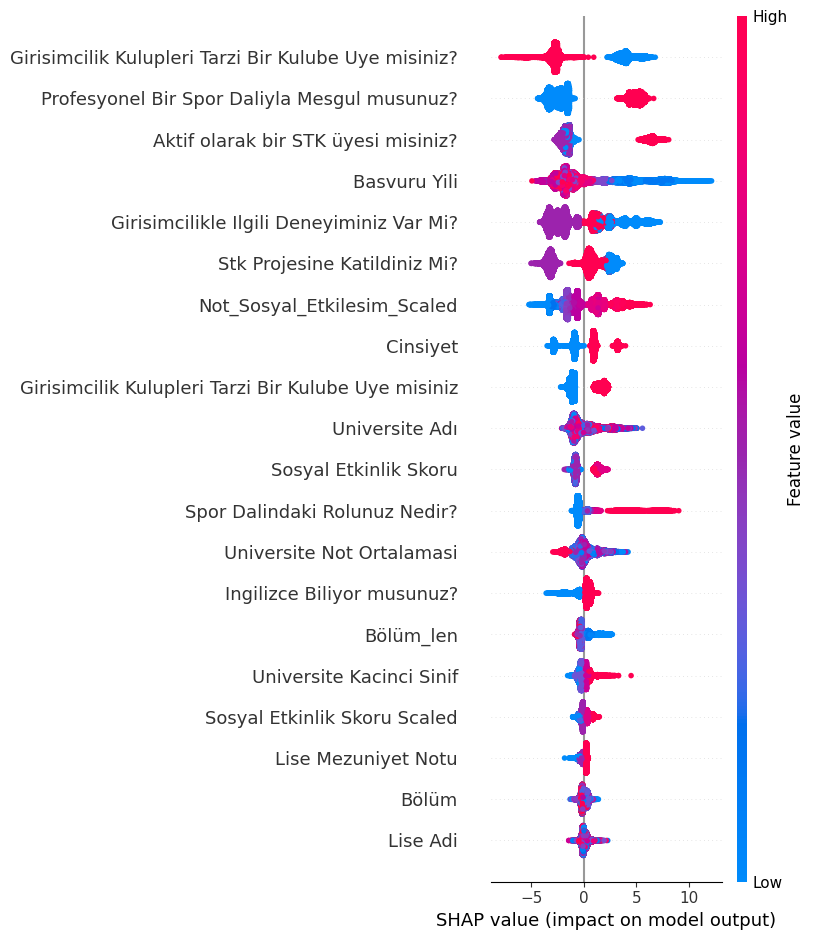

In [44]:
explainer = shap.TreeExplainer(model_tercih_edilen)
shap_values = explainer.shap_values(X)
shap.summary_plot(shap_values, X)

In [45]:
test_tahminleri = model_tercih_edilen.predict(test[X.columns])
sonuc_df = pd.DataFrame({
    'Degerlendirme Puani': test_tahminleri,
    'id': test.index
})

sonuc_df.to_csv('sub.csv', index=False)

print("\nTahminlerin Ayrıntılı Analizi:")
print("-" * 30)
print(sonuc_df['Degerlendirme Puani'].describe())

print("\nSonuçlar 'sub.csv' dosyasına kaydedildi.")


Tahminlerin Ayrıntılı Analizi:
------------------------------
count    11049.000000
mean        30.427318
std         13.607201
min          1.116292
25%         19.634251
50%         30.764314
75%         40.764344
max         66.153683
Name: Degerlendirme Puani, dtype: float64

Sonuçlar 'sub.csv' dosyasına kaydedildi.
